<img src="https://res.cloudinary.com/grohealth/image/upload/c_fill,f_auto,fl_lossy,h_650,q_auto,w_1085/v1581695681/DCUK/Content/causes-of-diabetes.png" width="240" height="360" />

# Prediction of Diabetic Condition using the given Patient Feature Information

# What is Diabetic & Diabetic Condition

-- **Diabetic** in general is considered as a Disease all over
-- But in Medical terms Diabetic is actually a **Bio-Chemical Imbalance or Disorder** that gradually develop over a time in Human Body. 
-- The Imbalance occurs when **Blood Glucose/Sugar** level in the Blood reaches to a point where it cannot be broken down or naturally synthesised within the human body
This leads to a condition where **Blood Glucose/Sugar** Level reaches to dangerous levels in the blood that will further complicate the normal functioning of other vital organs in the human body the important organ being **Brain** & can lead to **Brain Strokes , Cardiac Arrest, Kidney Failures , Liver Failures** & causes Irreversible damage to Other Important Internal Organs.

-- India has one of the highest number of people diagnoised with Diabeties **5% of Total Population** in the world

-- Approximately **463 million adults suffer from diabeties world wide**

# Blood Sugar Levels & Ranges
-- Fasting Sugar less then 100 mg/dl (Fasting)

-- Post Fasting Sugar less then 140 mg/dl ( After Eating) 


# **1. Problem Statement**

**We are given Specific Medical condition of several patients as datapoints or Features.
Using these Features we need to predict the probability of the patients if they are Diabetic or Non Diabetic 
With the given data we need to provide visual dashboard/graphs to show how the Features are related to each other**


# **2 . Data Feature and Description**`

The diabeties dataset captures patients information generated with respect to their health condition 

**Pregnancies** - Number of times a woman has tested positive for Pregnency test or concieved

**Glucose**	- Existing Blood glucose level reading in mg/dl ( Fasting < 100 mg/dl Non Fasting <= 140 mg/dl)

**BloodPressure**	- The blood pressure of the Individual patient in mm/Hg (between 90/60mmHg and 120/80mmHg mm of mercury)

**SkinThickness**	- Thickness of the skin ( Determined by Collagen content) 

**Insulin**	-  Insulin Concentration Units in pmol/L

**BMI**	- Body mass index of the patient in Kg/m2 (body mass divided by the square of the body height)

**Diabetes Pedigree Function** - a function which scores likelihood of diabetes based on family history) 
        
**Age**	- Age of the patient in years

**Outcome**- Indicates if a patient is disbetic or not ( 1 - Diabetic , 0 - Not Diabetic)
 


# **3. Importing  Python packages**




In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
sns.set()
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline


C:\Users\suraj\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# **4. Importing the Dataset**

In [2]:
diabetes_data = pd.read_csv("https://raw.githubusercontent.com/skm1124/Machine-Learning/master/diabetes.csv")

# **5. Features of the Dataset**

In [3]:
diabetes_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
diabetes_data.info(all)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


# **6. Exploratory Data Analysis**



### Pandas Profiling - Pre Processing

In [5]:
# To install pandas profiling please run this command.

!pip install pandas-profiling

In [6]:
import pandas_profiling 

In [7]:
# To output pandas profiling report to an external html file.
# Saving the output as profiling_before_preprocessing.html


profile = diabetes_data.profile_report(title='Pandas Profiling before Data Preprocessing')
profile.to_file(output_file="profiling_before_preprocessing_Diabetes Dataset.html")


# To output the pandas profiling report on the notebook.

diabetes_data.profile_report(title='Pandas Profiling before Data Preprocessing Diabetes Dataset')# style={'full_width':True})

In [8]:
diabetes_data.info(verbose= True)
diabetes_data.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


(768, 9)

In [9]:
diabetes_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


Generating descriptive statistics that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values. 

The columns have a minimum value of 'Zero' indicating NAN Values

**1. Glucose**
**2. BloodPressure**
**3. SkinThickness**
**4. Insulin**
**5. BMI**

#### Check for the missing or null values present in the dataset. 

In [14]:
diabetes_data_copy.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

#### There are missing or null value in the dataset & we need to fix this

In [12]:
diabetes_data_copy = diabetes_data.copy(deep = True)
diabetes_data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = diabetes_data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

#### Showing the count for Null Value

In [13]:
print(diabetes_data_copy.isnull().sum())

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64


#### Since there are Nan ( Not a Number) values or fields in the dataset 
#### The Nan values needs to be Imputed (Mean , Median , Mode etc)  for that we need to plot Histogram or Bar chart to understand the Data distribution

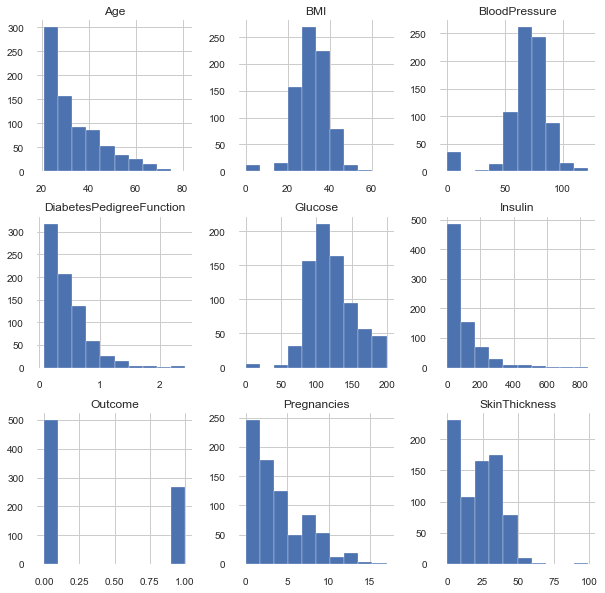

In [15]:
p = diabetes_data.hist(figsize = (10,10))

#### Imputing Nan values for the columns 'Glucose', 'BloodPressure', 'SkinnThickness', 'Insulin' & 'BMI' based on the their distribution


In [16]:
diabetes_data_copy['Glucose'].fillna(diabetes_data_copy['Glucose'].mean(), inplace = True)
diabetes_data_copy['BloodPressure'].fillna(diabetes_data_copy['BloodPressure'].mean(), inplace = True)
diabetes_data_copy['SkinThickness'].fillna(diabetes_data_copy['SkinThickness'].median(), inplace = True)
diabetes_data_copy['Insulin'].fillna(diabetes_data_copy['Insulin'].median(), inplace = True)
diabetes_data_copy['BMI'].fillna(diabetes_data_copy['BMI'].median(), inplace = True)

#### Analysing Plots Post Imputing for Nan Values

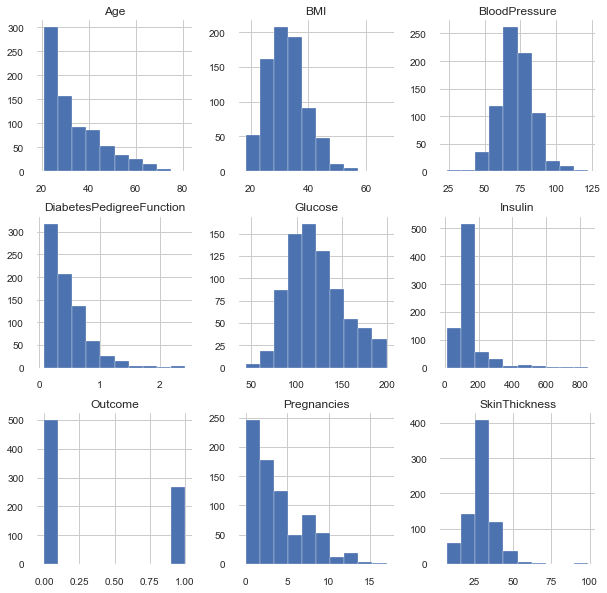

In [17]:
p = diabetes_data_copy.hist(figsize = (10,10))

In [19]:
diabetes_data_copy.info(all)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    float64
 2   BloodPressure             768 non-null    float64
 3   SkinThickness             768 non-null    float64
 4   Insulin                   768 non-null    float64
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(6), int64(3)
memory usage: 54.1 KB


#### Using PairPlot to visualize Pairwise Relationship

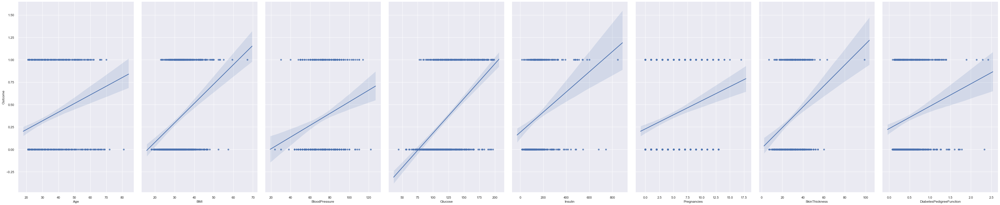

In [28]:
sns.pairplot(diabetes_data_copy, x_vars=['Age', 'BMI', 'BloodPressure','Glucose','Insulin','Pregnancies', 'SkinThickness', 'DiabetesPedigreeFunction'], y_vars='Outcome', height = 5, size = 10, aspect= 0.6, kind='reg')

The above graph shows that the data is biased towards datapoints having outcome value as 0 where it means that diabetes was not present actually. The number of non-diabetics is almost twice the number of diabetic patients

## Co-relation plot

In [20]:
diabetes_data_copy.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.127911,0.208522,0.081770,0.025047,0.021559,-0.033523,0.544341,0.221898
Glucose,0.127911,1.000000,0.218367,0.192686,0.419064,0.231128,0.137060,0.266534,0.492928
BloodPressure,0.208522,0.218367,1.000000,0.191853,0.045087,0.281199,-0.002763,0.324595,0.166074
SkinThickness,0.081770,0.192686,0.191853,1.000000,0.155610,0.543205,0.102188,0.126107,0.214873
Insulin,0.025047,0.419064,0.045087,0.155610,1.000000,0.180241,0.126503,0.097101,0.203790
BMI,0.021559,0.231128,0.281199,0.543205,0.180241,1.000000,0.153438,0.025597,0.312038
DiabetesPedigreeFunction,-0.033523,0.137060,-0.002763,0.102188,0.126503,0.153438,1.000000,0.033561,0.173844
Age,0.544341,0.266534,0.324595,0.126107,0.097101,0.025597,0.033561,1.000000,0.238356
Outcome,0.221898,0.492928,0.166074,0.214873,0.203790,0.312038,0.173844,0.238356,1.000000


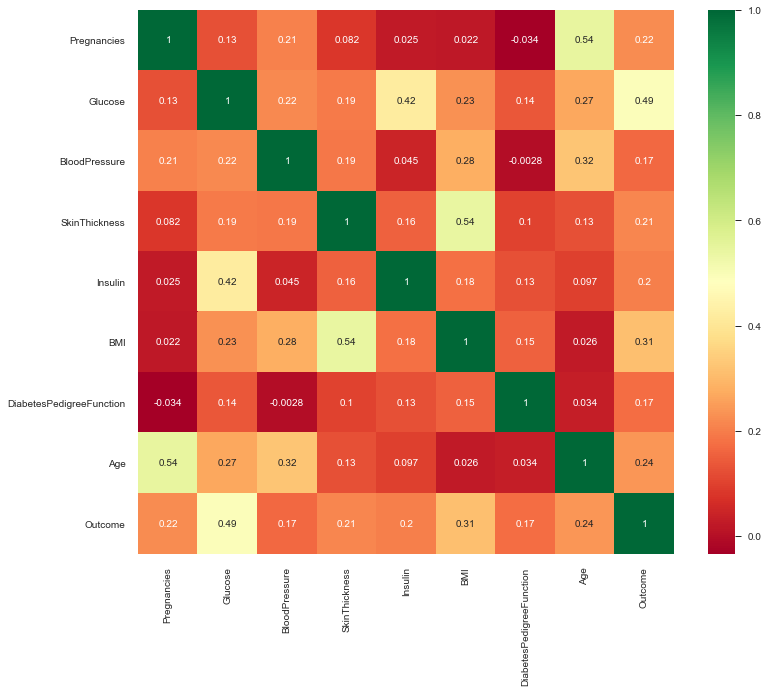

In [21]:
plt.figure(figsize=(12,10))  # on this line I just set the size of figure to 12 by 10.
p=sns.heatmap(diabetes_data_copy.corr(), annot=True,cmap ='RdYlGn') 

**Observation**

Correlation between Column Glucose and Outcome is highest i.e. 0.49 
Correlation between Column BMI and outcome i.e. 0.31.

Correlations vary from -1 to +1. 
Correlation coefficient that are near to +1 means strong positive correlation 
Correlation coffecient that are near to -1 means strong negative correlation. 
Correlation coefficient that is near to 0  means not very strongly correlated. 
To Build a good & effecient model the Correlation R measure should be around 0.7 ~ 0.8

**Eg:-**
<img src="https://www.statisticshowto.com/wp-content/uploads/2012/10/pearson-2-small.png" width="500" height="500" />


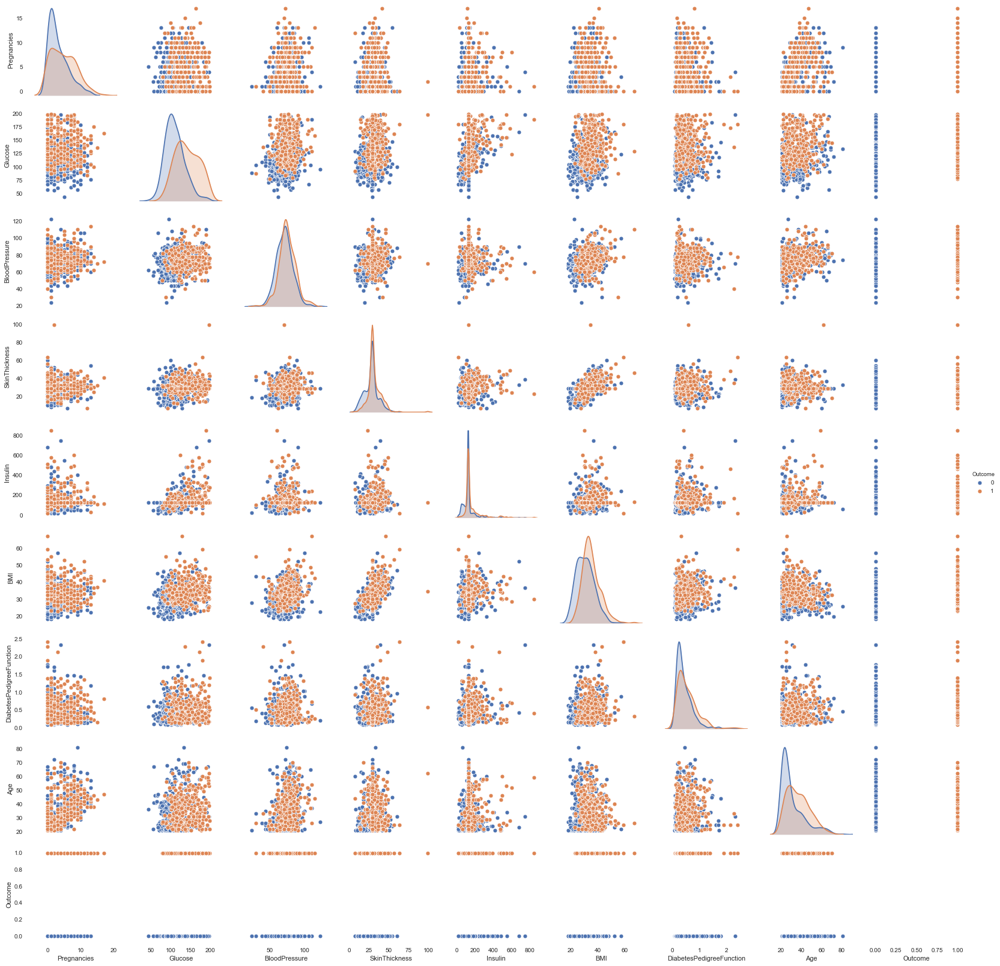

In [22]:
p=sns.pairplot(diabetes_data_copy, hue = 'Outcome')

### Pandas Profiling after Data Preprocessing

In [23]:
# To output pandas profiling report to an external html file.
# Saving the output as profiling_after_preprocessing.html

profile = diabetes_data_copy.profile_report(title='Pandas Profiling after Data Preprocessing')
profile.to_file(output_file="profiling_after_preprocessing_Diabetes Dataset.html")


# To output the pandas profiling report on the notebook.

diabetes_data_copy.profile_report(title='Pandas Profiling after Data Preprocessing Diabetes Dataset') #  style={'full_width':True})

# **7. Applying Models for prediction**

### **7a. We have used Different Classification Models for Diabetes Prediction **

     Random Forest Classifier
     Logistic Regression
     DecisionTree Classifier
     DecisionTree With Grid Search Method

### **Preparing X and y coordinates to be used in the data set**


In [24]:
X = diabetes_data_copy.loc[:,diabetes_data_copy.columns != 'Outcome']
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.0,125.0,33.6,0.627,50
1,1,85.0,66.0,29.0,125.0,26.6,0.351,31
2,8,183.0,64.0,29.0,125.0,23.3,0.672,32
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33


In [25]:
y = diabetes_data_copy.Outcome 

### **Splitting X and y into Training and Test datasets** 
This is done to minimise the effect of Data Descripencies

In [26]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

In [27]:
print(X_train.shape)
print(y_train.shape)

(614, 8)
(614,)


## Decision Tree in scikit-learn

To apply any machine learning algorithm on your dataset, basically there are 4 steps:
1. Load the algorithm
2. Instantiate and Fit the model to the training dataset
3. Prediction on the test set
4. Calculating the accuracy of the model

In [28]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression() # this is base model, because no parameters 
logreg.fit(X_train,y_train) # It trains the model on Train Data 

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [29]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
grid={"C":np.logspace(-3,3,7), 
      "penalty":["l1","l2"], 
      "tol":[0.01,0.001,0.0001]}# l1 lasso l2 ridge
logreg=LogisticRegression()
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='warn',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='warn',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2'],
                         'tol': [0.01, 0.001, 0.0001]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [31]:
print("tuned hyperparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 1.0, 'penalty': 'l1', 'tol': 0.01}
accuracy : 0.7654723127035831


In [34]:
logreg_cv.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='warn',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='warn',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2'],
                         'tol': [0.01, 0.001, 0.0001]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

**Plotting the model for prediction**


In [35]:
logreg.fit(X_train,y_train)
y_pred_train = logreg.predict(X_train)
logreg.predict_proba(X_train)[0]   
y_pred_test = logreg.predict(X_test)                                         

In [36]:
len(y_test)

154

### Model Evaluation using __accuracy_score__

In [37]:
from sklearn.metrics import accuracy_score
print('Accuracy score for test data is:', accuracy_score(y_test,y_pred_test))

Accuracy score for test data is: 0.7727272727272727


In [38]:
y_test

285    0
101    0
581    0
352    0
726    0
      ..
563    0
318    0
154    1
684    0
643    0
Name: Outcome, Length: 154, dtype: int64

In [39]:
y_pred_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0],
      dtype=int64)

### **Model Evaluation using Confusion Matrix**

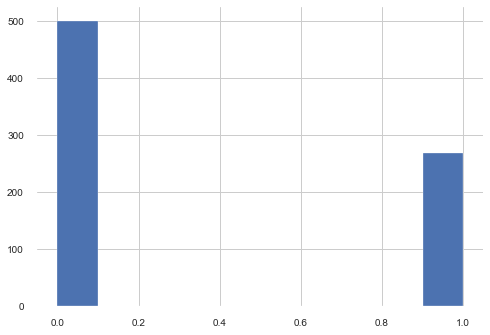

In [40]:
diabetes_data_copy['Outcome'].hist()

In [41]:
from sklearn.metrics import confusion_matrix

confusion_matrix = pd.DataFrame(confusion_matrix(y_test, y_pred_test))

print(confusion_matrix)

    0   1
0  89  10
1  25  30


In [42]:
confusion_matrix.index = ['Non Diabetic','Diabetic']
confusion_matrix.columns = ['Non Diabetic','Diabetic']
print(confusion_matrix)

              Non Diabetic  Diabetic
Non Diabetic            89        10
Diabetic                25        30


This means the model has made 89+30= **119 correct predictions** and 25+10 = **35 Incorrect Predictions**

In [43]:
preds1 = np.where(logreg.predict_proba(X_test)[:,1]> 0.75,1,0)
print('Accuracy score for test data is:', accuracy_score(y_test,preds1))

Accuracy score for test data is: 0.7272727272727273


In [44]:
preds2 = np.where(logreg.predict_proba(X_test)[:,1]> 0.25,1,0)
print('Accuracy score for test data is:', accuracy_score(y_test,preds2))

Accuracy score for test data is: 0.7142857142857143


### 7b. **Random Forest Classification**

In [45]:
from sklearn.ensemble import RandomForestClassifier
model1 = RandomForestClassifier(random_state = 0)

In [46]:
model1.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [47]:
model2=logreg.fit(X_train,y_train)

### **7c. Decision Tree**

In [48]:
from sklearn import tree
model3 = tree.DecisionTreeClassifier(random_state = 0) # this is the part of the code where the type of decision tree is called oud ( Classification or Regression)
model3.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')

In [49]:
import sys
!{sys.executable} -m pip install graphviz
!{sys.executable} -m pip install pydotplus
!{sys.executable} -m pip install Ipython

from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image

export_graphviz(model3, 
                out_file='decision_tree.dotplus',
                feature_names= X.columns, 
                rounded=True, 
                precision=4, 
                node_ids=True, 
                proportion=True,
                filled=True)

(graph,) = pydotplus.graph_from_dot_file('decision_tree.dotplus')
graph.write_png('decision_tree.png')

Image(filename='decision_tree.png') 

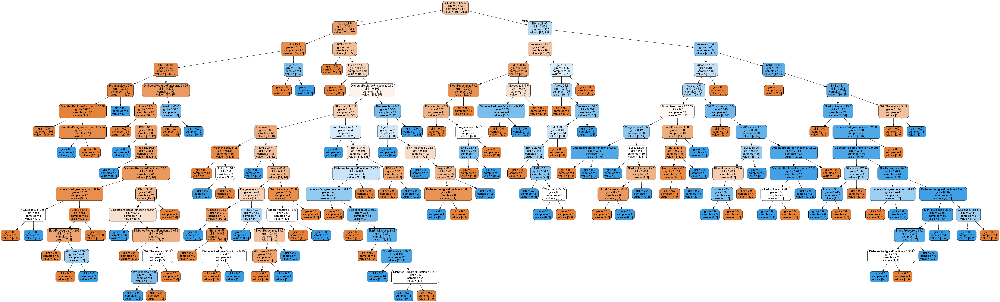

In [52]:
import pydotplus
from IPython.display import Image

dot_tree = tree.export_graphviz(model3, out_file=None,filled=True, rounded=True, 
                                special_characters=True, feature_names=X.columns)
graph = pydotplus.graph_from_dot_data(dot_tree)  

Image(graph.create_png())

## Decision Tree with Gridsearch

In [54]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
model4 = DecisionTreeClassifier(random_state = 0)
tree_para = [{'criterion':['gini','entropy'],'max_depth': range(2,60),
                             'max_features': ['sqrt', 'log2', None] }]
                        
                            

grid_search = GridSearchCV(model4 ,tree_para, cv=10, refit='AUC')
grid_search.fit(X_train, y_train)
model4.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')

In [55]:
y_pred_train4 = model4.predict(X_train) 
y_pred_test4 = model4.predict(X_test) 

**Using models for Prediction**


In [56]:
prediction1_test = model1.predict(X_test)
prediction1_train = model1.predict(X_train) 

In [57]:
prediction2_test = model2.predict(X_test)
prediction2_train = model2.predict(X_train) 


In [58]:
prediction3_test = model3.predict(X_test)
prediction3_train = model3.predict(X_train)

In [59]:
y_pred_train4 = model4.predict(X_train) 
y_pred_test4 = model4.predict(X_test) 

In [60]:
prediction4_test = model4.predict(X_test)
prediction4_train = model4.predict(X_train)

### **8. Calculating the accuracy score of the Models created**




In [61]:
from sklearn.metrics import accuracy_score
print('Accuracy score for test data with model 1 - Random Forest is:',accuracy_score(y_test, prediction1_test))
print('Accuracy score for test data with model 2 - Logistic Regression is:',accuracy_score(y_test, prediction2_test))
print('Accuracy score for test data with model 3 - Decision Tree is:',accuracy_score(y_test, prediction3_test))
print('Accuracy score for test data with model 4 - Grid Search Method:',accuracy_score(y_test, prediction4_test))

Accuracy score for test data with model 1 - Random Forest is: 0.7987012987012987
Accuracy score for test data with model 2 - Logistic Regression is: 0.7727272727272727
Accuracy score for test data with model 3 - Decision Tree is: 0.6948051948051948
Accuracy score for test data with model 4 - Grid Search Method: 0.6948051948051948


## Conclusion for Accuracy Score 
### Random Forest Classifer is providing better prediction model with a score of 0.798

#### **8a . Confusion Matrix**


In [62]:
from sklearn.metrics import confusion_matrix
print('Confusion matrix for test data with Random Forest model is:\n',confusion_matrix(y_test, prediction1_test))
print('Confusion matrix for test data with Logistic Regression is:\n',confusion_matrix(y_test, prediction2_test))
print('Confusion matrix for test data with Decision Trees is:\n',confusion_matrix(y_test, prediction3_test))
print('Confusion matrix for test data with Grid Search Mehod is:\n',confusion_matrix(y_test, prediction3_test))

Confusion matrix for test data with Random Forest model is:
 [[88 11]
 [20 35]]
Confusion matrix for test data with Logistic Regression is:
 [[89 10]
 [25 30]]
Confusion matrix for test data with Decision Trees is:
 [[73 26]
 [21 34]]
Confusion matrix for test data with Grid Search Mehod is:
 [[73 26]
 [21 34]]


In [63]:
# To find the Accuracy of the Confusion Matrix

Accuracy_RandomForest = 88+35/(88+11+20+35)
print('Accuracy of RandomForest is :' ,  Accuracy_RandomForest)

Accuracy_LogisticRegression = 89+30/(89+10+25+30)
print('Accuracy of Logistic Regression  is :' ,  Accuracy_LogisticRegression)

Accuracy_DecissionTree = 89+30/(89+10+25+30)
print('Accuracy of DecissionTree  is :' ,  Accuracy_DecissionTree)

Accuracy_GridSearch = 89+30/(89+10+25+30)
print('Accuracy of GridSearch  is :' ,  Accuracy_GridSearch)

Accuracy of RandomForest is : 88.22727272727273
Accuracy of Logistic Regression  is : 89.1948051948052
Accuracy of DecissionTree  is : 89.1948051948052
Accuracy of GridSearch  is : 89.1948051948052


#### **8b . Model evaluation using Precision score**


In [64]:
from sklearn.metrics import precision_score
precision1 = precision_score(y_test,prediction1_test)
print('Precision score for test data using Random Forest is:', precision1)
precision2 = precision_score(y_test,prediction2_test)
print('Precision score for test data using Logistic Regression is:', precision2)
precision3 = precision_score(y_test,prediction3_test)
print('Precision score for test data using Decision Tree is:', precision3)
precision4 = precision_score(y_test,prediction4_test)
print('Precision score for test data using Grid Search Methid is:', precision3)

Precision score for test data using Random Forest is: 0.7608695652173914
Precision score for test data using Logistic Regression is: 0.75
Precision score for test data using Decision Tree is: 0.5666666666666667
Precision score for test data using Grid Search Methid is: 0.5666666666666667


#### **8c . Model evaluation using F1 score**

In [65]:
from sklearn.metrics import f1_score
print('F1_score for test data using Random Forest is       :',f1_score(y_test, prediction1_test))
print('F1_score for test data using Logistic Regression is :',f1_score(y_test, prediction2_test))
print('F1_score for test data using Decision Trees is      :',f1_score(y_test, prediction3_test))
print('F1_score for test data using Grid Search Method is      :',f1_score(y_test, prediction4_test))

F1_score for test data using Random Forest is       : 0.693069306930693
F1_score for test data using Logistic Regression is : 0.631578947368421
F1_score for test data using Decision Trees is      : 0.591304347826087
F1_score for test data using Grid Search Method is      : 0.591304347826087


#### **8d . Model evaluation using AUC ROC curve**

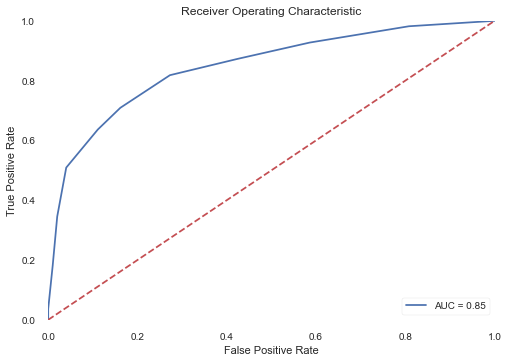

In [66]:
from sklearn import metrics
probs = model1.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

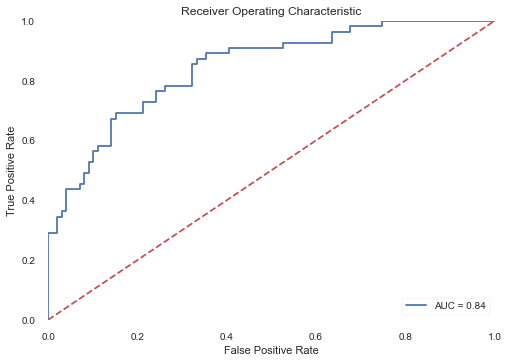

In [67]:
from sklearn import metrics
probs = model2.predict_proba(X_test)
pred = probs[:,1]
fpr1, tpr1, threshold = metrics.roc_curve(y_test, pred)
roc_auc = metrics.auc(fpr1, tpr1)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr1, tpr1, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

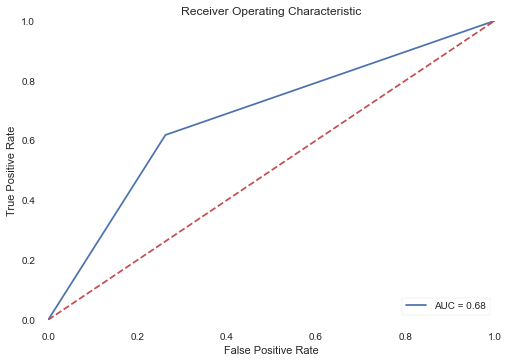

In [68]:
from sklearn import metrics
probs = model3.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# 9 . Conclusion

## As per the Evaluation metrics we can see that 'Random Forest Classifier' has better Predication rate then the other Models 

 Model-Evaluation   Accuracy Score   Confusion Matrix  Precision Score  F1 Score  AUC    ROC
                    
                                    
                                                       
Random Forest            0.79                0.88             0.76       0.69     

Logistic Regression      0.77                0.89             0.75       0.63

Decision Tree            0.69                0.89             0.56       0.59    0.85   0.84

DT with Grid Search      0.69                0.89             0.56       0.59